<a href="https://colab.research.google.com/github/KwonHo-geun/AI_Study/blob/main/25.07.15_TransferLearning_Dog_and_Cat.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install gdown

In [ ]:
from tensorflow import keras

dir(keras.applications)

In [ ]:
vgg16 = keras.applications.vgg16.VGG16()
vgg16.summary()

In [ ]:
from tensorflow.keras.utils import plot_model

plot_model(vgg16)

In [5]:
import gdown, zipfile, os

if not os.path.isfile('VGG16_test.zip'):
    gdown.download(id='11LZAFSFVtDsdKdLcFR9E-MaDoar6C3R5', output='VGG16_test.zip')
    VGG16_test = zipfile.ZipFile('VGG16_test.zip')
    VGG16_test.extractall()
    VGG16_test.close()

Downloading...
From: https://drive.google.com/uc?id=11LZAFSFVtDsdKdLcFR9E-MaDoar6C3R5
To: /content/VGG16_test.zip
100%|██████████| 338k/338k [00:00<00:00, 4.74MB/s]


In [6]:
with open('imagenet_classes.txt') as f:
    labels = [line.strip() for line in f.readlines()]

print(labels)

['tench, Tinca tinca', 'goldfish, Carassius auratus', 'great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias', 'tiger shark, Galeocerdo cuvieri', 'hammerhead, hammerhead shark', 'electric ray, crampfish, numbfish, torpedo', 'stingray', 'cock', 'hen', 'ostrich, Struthio camelus', 'brambling, Fringilla montifringilla', 'goldfinch, Carduelis carduelis', 'house finch, linnet, Carpodacus mexicanus', 'junco, snowbird', 'indigo bunting, indigo finch, indigo bird, Passerina cyanea', 'robin, American robin, Turdus migratorius', 'bulbul', 'jay', 'magpie', 'chickadee', 'water ouzel, dipper', 'kite', 'bald eagle, American eagle, Haliaeetus leucocephalus', 'vulture', 'great grey owl, great gray owl, Strix nebulosa', 'European fire salamander, Salamandra salamandra', 'common newt, Triturus vulgaris', 'eft', 'spotted salamander, Ambystoma maculatum', 'axolotl, mud puppy, Ambystoma mexicanum', 'bullfrog, Rana catesbeiana', 'tree frog, tree-frog', 'tailed frog, bell toad, 

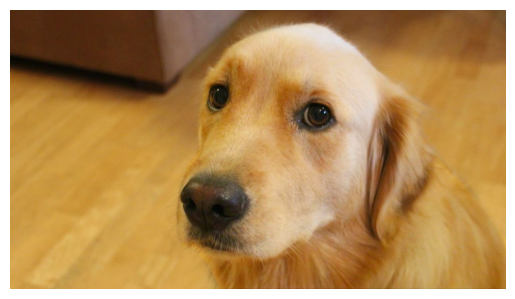

(720, 1280, 3)


In [7]:
import matplotlib.pyplot as plt
import matplotlib.image as image

img = image.imread("golden.jpg")
plt.imshow(img)
plt.axis('off')

plt.show()
print(img.shape)

In [ ]:
import tensorflow as tf
import numpy as np

img = tf.image.resize(img,(224,224))
out=vgg16(tf.keras.applications.vgg16.preprocess_input(tf.expand_dims(img,axis=0)))
print(out)

In [9]:
top_5 = np.argsort(-out[0])[:5]
for idx in top_5:
    print(f"{labels[idx]} : {out[0,idx]*100:.3f}%")

golden retriever : 94.428%
Afghan hound, Afghan : 4.389%
Saluki, gazelle hound : 0.521%
cocker spaniel, English cocker spaniel, cocker : 0.232%
Irish setter, red setter : 0.079%


(427, 640, 3)


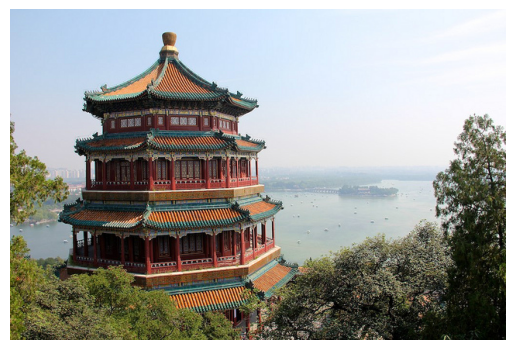

In [10]:
from sklearn.datasets import load_sample_image

img = load_sample_image('china.jpg')
print(img.shape)

plt.imshow(img)
plt.axis('off')
plt.show()

In [11]:
img = tf.image.resize(img,(224,224))
out=vgg16(tf.keras.applications.vgg16.preprocess_input(img[np.newaxis,:,:,:]))

top_5 = np.argsort(-out[0])[:5]
for idx in top_5:
    print(f"{labels[idx]} : {out[0,idx]*100:.4f}%")

monastery : 28.6342%
stupa, tope : 21.2258%
palace : 18.4324%
church, church building : 17.1889%
boathouse : 4.3878%


(427, 640, 3)


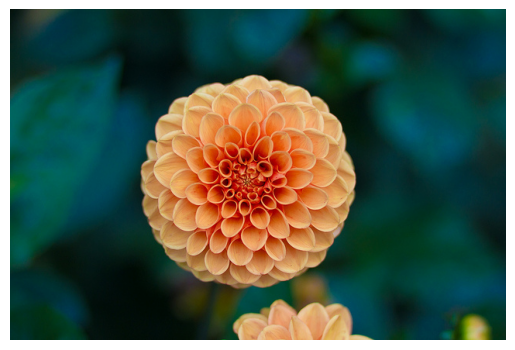

In [12]:
img = load_sample_image('flower.jpg')
print(img.shape)

plt.imshow(img)
plt.axis('off')
plt.show()

In [13]:
img = tf.image.resize(img,(224,224))
out=vgg16(tf.keras.applications.vgg16.preprocess_input(img[np.newaxis,:,:,:]))

top_5 = np.argsort(-out[0])[:5]
for idx in top_5:
    print(f"{labels[idx]} : {out[0,idx]*100:.4f}%")

daisy : 18.0349%
bee : 5.5377%
bell pepper : 5.2733%
zucchini, courgette : 4.4060%
coral fungus : 4.2526%


In [14]:
img = image.imread("golden.jpg")
img = tf.image.resize(img,(224,224))
out=vgg16(tf.keras.applications.vgg16.preprocess_input(tf.expand_dims(img,axis=0)))

top_20 = np.argsort(-out[0])[:20]
for idx in top_20:
    print(f"{labels[idx]} : {out[0,idx]*100:.3f}%")

golden retriever : 94.428%
Afghan hound, Afghan : 4.389%
Saluki, gazelle hound : 0.521%
cocker spaniel, English cocker spaniel, cocker : 0.232%
Irish setter, red setter : 0.079%
otterhound, otter hound : 0.067%
collie : 0.056%
Labrador retriever : 0.042%
redbone : 0.033%
bloodhound, sleuthhound : 0.024%
tennis ball : 0.016%
basset, basset hound : 0.013%
Shetland sheepdog, Shetland sheep dog, Shetland : 0.012%
English setter : 0.012%
flat-coated retriever : 0.012%
Sussex spaniel : 0.011%
bath towel : 0.010%
Gordon setter : 0.008%
Great Pyrenees : 0.005%
black-and-tan coonhound : 0.004%


**[실습1] (10분) (i) labrador.jpg를 출력하시오. VGG16이 예측하는 톱 5의 클래스 이름과 확률을 출력하시오.**

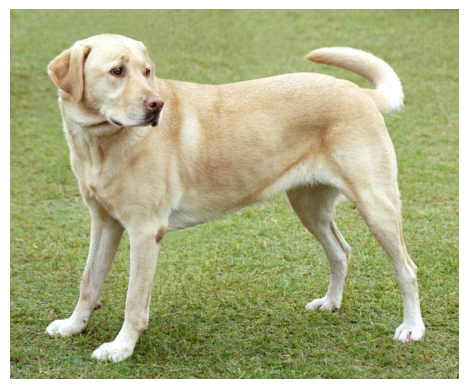

In [15]:
import matplotlib.pyplot as plt
import matplotlib.image as image
import cv2
img1 = cv2.imread("labrador.jpg")  # BGR 포맷(Numpy 배열)
img1_rgb = cv2.cvtColor(img1, cv2.COLOR_BGR2RGB)  # 변수명을 정확히!
plt.imshow(img1_rgb)
plt.axis('off')
plt.show()


In [16]:
img1_rgb1 = tf.image.resize(img1_rgb,(224,224))
out=vgg16(tf.keras.applications.vgg16.preprocess_input(tf.expand_dims(img1_rgb1,axis=0)))

top_20 = np.argsort(-out[0])[:20]
for idx in top_20:
    print(f"{labels[idx]} : {out[0,idx]*100:.3f}%")

Labrador retriever : 41.079%
golden retriever : 16.162%
redbone : 4.517%
Chesapeake Bay retriever : 4.091%
kuvasz : 2.696%
Walker hound, Walker foxhound : 1.760%
Greater Swiss Mountain dog : 1.695%
English foxhound : 1.689%
Rhodesian ridgeback : 1.644%
kelpie : 1.597%
bloodhound, sleuthhound : 1.278%
vizsla, Hungarian pointer : 1.165%
Saluki, gazelle hound : 1.107%
curly-coated retriever : 0.943%
Ibizan hound, Ibizan Podenco : 0.906%
Great Pyrenees : 0.811%
bull mastiff : 0.714%
Eskimo dog, husky : 0.705%
Tibetan mastiff : 0.657%
dingo, warrigal, warragal, Canis dingo : 0.619%


 **(ii) strawberries.jpg를 출력하시오. VGG16이 예측하는 톱 5의 클래스 이름과 확률을 출력하시오.**

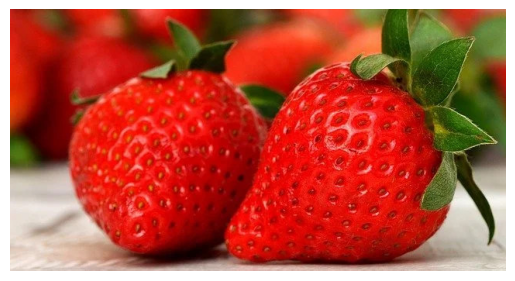

In [17]:
img2 = cv2.imread("strawberries.jpg")  # BGR 포맷(Numpy 배열)
img1_rgb2 = cv2.cvtColor(img2, cv2.COLOR_BGR2RGB)  # 변수명을 정확히!
plt.imshow(img1_rgb2)
plt.axis('off')
plt.show()

In [18]:
img2_rgb2 = tf.image.resize(img1_rgb2,(224,224))
out=vgg16(tf.keras.applications.vgg16.preprocess_input(tf.expand_dims(img2_rgb2,axis=0)))

top_20 = np.argsort(-out[0])[:20]
for idx in top_20:
    print(f"{labels[idx]} : {out[0,idx]*100:.3f}%")

strawberry : 99.984%
banana : 0.004%
strainer : 0.003%
orange : 0.003%
pineapple, ananas : 0.002%
chocolate sauce, chocolate syrup : 0.001%
lemon : 0.001%
pomegranate : 0.001%
tray : 0.000%
pot, flowerpot : 0.000%
ice cream, icecream : 0.000%
paper towel : 0.000%
bell pepper : 0.000%
grocery store, grocery, food market, market : 0.000%
trifle : 0.000%
thimble : 0.000%
cup : 0.000%
candle, taper, wax light : 0.000%
Granny Smith : 0.000%
cock : 0.000%


**(iii) car.jpg를 출력하시오. VGG16이 예측하는 톱 5의 클래스 이름과 확률을 출력하시오.**


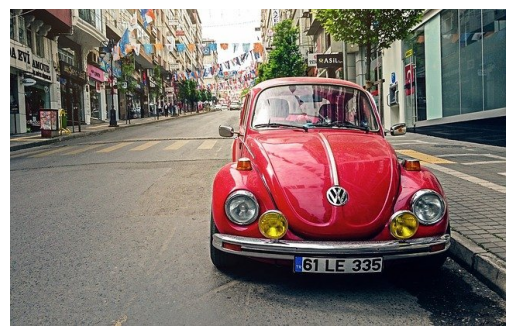

In [19]:
img3 = cv2.imread("car.jpg")  # BGR 포맷(Numpy 배열)
img2_rgb3 = cv2.cvtColor(img3, cv2.COLOR_BGR2RGB)  # 변수명을 정확히!
plt.imshow(img2_rgb3)
plt.axis('off')
plt.show()

In [20]:
img2_rgb3 = tf.image.resize(img2_rgb3,(224,224))
out=vgg16(tf.keras.applications.vgg16.preprocess_input(tf.expand_dims(img2_rgb3,axis=0)))

top_20 = np.argsort(-out[0])[:20]
for idx in top_20:
    print(f"{labels[idx]} : {out[0,idx]*100:.3f}%")

cab, hack, taxi, taxicab : 74.703%
streetcar, tram, tramcar, trolley, trolley car : 6.097%
sports car, sport car : 4.560%
go-kart : 1.546%
trolleybus, trolley coach, trackless trolley : 1.259%
motor scooter, scooter : 1.136%
fire engine, fire truck : 1.033%
ambulance : 0.942%
minibus : 0.912%
vacuum, vacuum cleaner : 0.662%
tow truck, tow car, wrecker : 0.573%
passenger car, coach, carriage : 0.499%
minivan : 0.444%
ashcan, trash can, garbage can, wastebin, ash bin, ash-bin, ashbin, dustbin, trash barrel, trash bin : 0.403%
convertible : 0.370%
pickup, pickup truck : 0.321%
racer, race car, racing car : 0.314%
moped : 0.312%
limousine, limo : 0.292%
traffic light, traffic signal, stoplight : 0.261%


# 전이 학습 (transfer learning)

In [ ]:
conv_base = keras.applications.vgg16.VGG16(
    include_top=False,
    input_shape=(180, 180, 3))

conv_base.trainable = False

conv_base.summary()

In [22]:
import pathlib
from tensorflow.keras.utils import image_dataset_from_directory

if not os.path.isdir('cats_vs_dogs_small'):
    gdown.download(id='1z2WPTBUI-_Q2jZtcRtQL0Vxigh-z6dyW', output='cats_vs_dogs_small.zip')
    cats_vs_dogs_small = zipfile.ZipFile('cats_vs_dogs_small.zip')
    cats_vs_dogs_small.extractall()
    cats_vs_dogs_small.close()

base_dir = pathlib.Path("cats_vs_dogs_small")

train_dataset = image_dataset_from_directory(
    base_dir / "train",
    image_size=(180, 180),
    batch_size=32)
validation_dataset = image_dataset_from_directory(
    base_dir / "validation",
    image_size=(180, 180),
    batch_size=32)
test_dataset = image_dataset_from_directory(
    base_dir / "test",
    image_size=(180, 180),
    batch_size=32)

Downloading...
From (original): https://drive.google.com/uc?id=1z2WPTBUI-_Q2jZtcRtQL0Vxigh-z6dyW
From (redirected): https://drive.google.com/uc?id=1z2WPTBUI-_Q2jZtcRtQL0Vxigh-z6dyW&confirm=t&uuid=c7b34b24-092f-4539-b2a1-0b4aacd066a6
To: /content/cats_vs_dogs_small.zip
100%|██████████| 114M/114M [00:01<00:00, 67.5MB/s]


Found 2000 files belonging to 2 classes.
Found 1000 files belonging to 2 classes.
Found 2000 files belonging to 2 classes.


In [23]:
from keras.layers import Flatten, Dense, Dropout

inputs = keras.Input(shape=(180, 180, 3))
x = keras.applications.vgg16.preprocess_input(inputs)
x = conv_base(x)
x = Flatten()(x)
x = Dense(256)(x)
x = Dropout(0.5)(x)
outputs = Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs, outputs)

In [ ]:
#Tensorflow -> C++기반
model.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"]
              )

callbacks = [keras.callbacks.ModelCheckpoint(
      filepath="feature_extraction.keras",
      save_best_only=True,
      monitor="val_loss")]

#학습
history = model.fit(
    train_dataset,
    epochs=50,
    validation_data=validation_dataset,
    callbacks=callbacks)

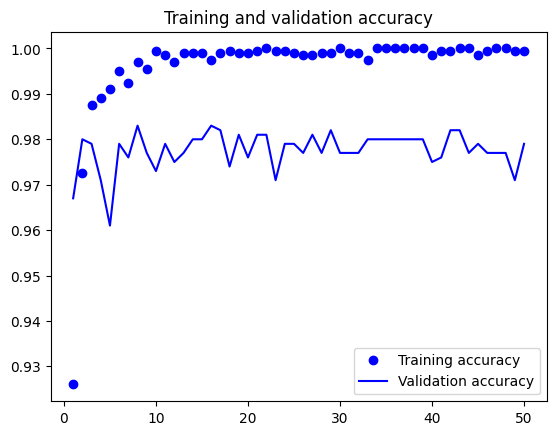

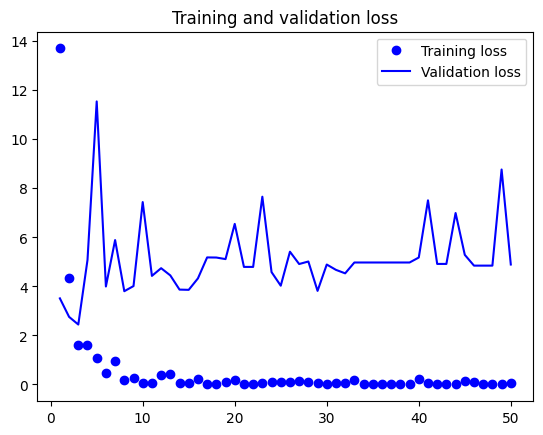

In [25]:
import matplotlib.pyplot as plt
acc = history.history["accuracy"]
val_acc = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, "bo", label="Training accuracy")
plt.plot(epochs, val_acc, "b", label="Validation accuracy")
plt.title("Training and validation accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()
plt.show()

In [26]:
test_model = keras.models.load_model(
    "feature_extraction.keras")
test_loss, test_acc = test_model.evaluate(test_dataset)
print(f"테스트 정확도: {test_acc:.3f}")

63/63 ━━━━━━━━━━━━━━━━━━━━ 10s 145ms/step - accuracy: 0.9693 - loss: 5.3624
테스트 정확도: 0.969


**증강 데이터 + 전이 학습**

In [27]:
from keras import layers

data_augmentation = keras.Sequential(
    [layers.RandomFlip("horizontal"),
     layers.RandomRotation(0.1),
     layers.RandomZoom(0.2)])

conv_base = keras.applications.vgg16.VGG16(
    include_top=False,
    input_shape=(180, 180, 3))
conv_base.trainable = False

inputs = keras.Input(shape=(180, 180, 3))
x = data_augmentation(inputs)
x = keras.applications.vgg16.preprocess_input(x)
x = conv_base(x)
x = Flatten()(x)
x = Dense(256)(x)
x = Dropout(0.5)(x)
outputs = Dense(1, activation="sigmoid")(x)
model = keras.Model(inputs, outputs)

In [ ]:
model.compile(loss="binary_crossentropy",
              optimizer="rmsprop",
              metrics=["accuracy"])

callbacks = [keras.callbacks.ModelCheckpoint(
        filepath="feature_extraction_with_data_augmentation.h5",
        save_best_only=True,
        monitor="val_loss")]

history = model.fit(
    train_dataset,
    epochs=50,
    validation_data=validation_dataset,
    callbacks=callbacks)

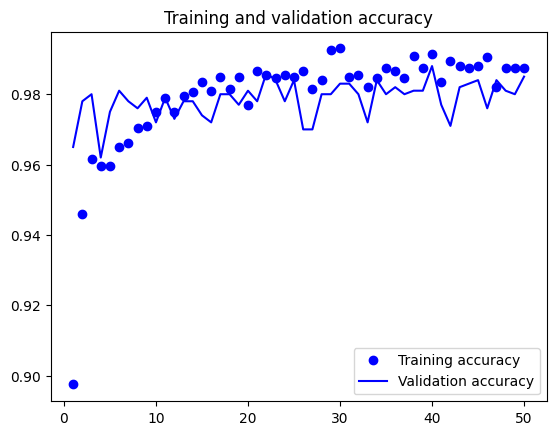

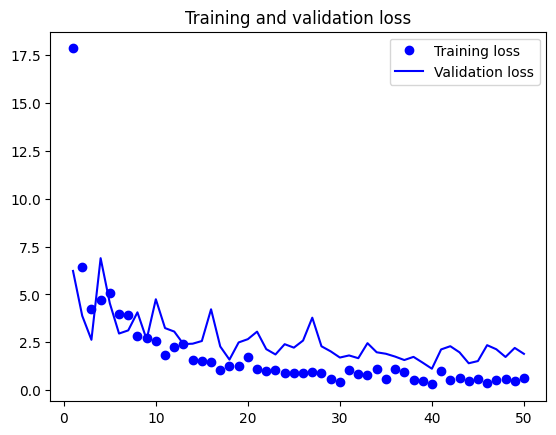

In [29]:
acc = history.history["accuracy"]
val_acc = history.history["val_accuracy"]
loss = history.history["loss"]
val_loss = history.history["val_loss"]
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, "bo", label="Training accuracy")
plt.plot(epochs, val_acc, "b", label="Validation accuracy")
plt.title("Training and validation accuracy")
plt.legend()
plt.figure()
plt.plot(epochs, loss, "bo", label="Training loss")
plt.plot(epochs, val_loss, "b", label="Validation loss")
plt.title("Training and validation loss")
plt.legend()
plt.show()

In [36]:
model.save("feature_extraction_with_data_augmentation.keras")

In [37]:
test_model = keras.models.load_model(
    "feature_extraction_with_data_augmentation.keras")
test_loss, test_acc = test_model.evaluate(test_dataset)
print(f"테스트 정확도: {test_acc:.3f}")

63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 86ms/step - accuracy: 0.9794 - loss: 1.8693
테스트 정확도: 0.976


**미세 조정(Fine Tuning)**

In [ ]:
conv_base.trainable = True
for layer in conv_base.layers[:-4]:
    layer.trainable = False

print("동결 해제층 :")
for layer in conv_base.layers:
    if layer.trainable:
        print(layer.name)

print("\n")
conv_base.summary()

In [ ]:
model.compile(loss="binary_crossentropy",
              optimizer=keras.optimizers.RMSprop(learning_rate=1e-5),
              metrics=["accuracy"])

callbacks = [keras.callbacks.ModelCheckpoint(
        filepath="fine_tuning.keras",
        save_best_only=True,
        monitor="val_loss")]

history = model.fit(
    train_dataset,
    epochs=30,
    validation_data=validation_dataset,
    callbacks=callbacks)

In [40]:
model = keras.models.load_model("fine_tuning.keras")
test_loss, test_acc = model.evaluate(test_dataset)
print(f"테스트 정확도: {test_acc:.3f}")

63/63 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - accuracy: 0.9772 - loss: 1.2887
테스트 정확도: 0.975


In [41]:
errors_cat = []
for i in range(1000):
    image_path = f'./cats_vs_dogs_small/test/cat/cat.{1500+i}.jpg'
    img = plt.imread(image_path)
    img = tf.image.resize(img,(180,180))
    img = tf.expand_dims(img,axis=0)
    if model(img)[0]>0.5:
        errors_cat.append(i)

print(errors_cat)
print(len(errors_cat))

[7, 17, 24, 32, 61, 75, 119, 130, 168, 172, 299, 304, 333, 370, 376, 406, 422, 462, 540, 548, 549, 561, 572, 659, 685, 743, 767, 776, 783, 844, 855, 858, 867, 891, 907, 922, 957, 976]
38


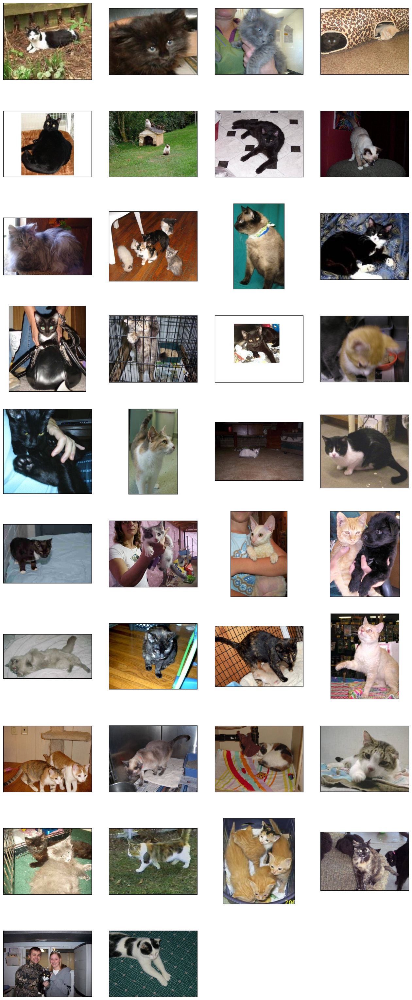

In [42]:
import math

plt.figure(figsize=(16, 4*math.ceil(len(errors_cat)/4)))
for i in range(len(errors_cat)):
    plt.subplot(math.ceil(len(errors_cat)/4),4,i+1)
    image_path = f'./cats_vs_dogs_small/test/cat/cat.{1500+errors_cat[i]}.jpg'
    image = plt.imread(image_path)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
plt.show()

**[실습3] (5분) (i) 신경망이 틀리게 대답한 강아지 이미지의 인덱스와 개수를 출력하시오.**
틀린 것은 분명하게 이미지나, 텍스트 등을 출력해야함

In [43]:
errors_cat = []
for i in range(1000):
    image_path = f'./cats_vs_dogs_small/test/cat/cat.{1500+i}.jpg'
    img = plt.imread(image_path)
    img = tf.image.resize(img,(180,180))
    img = tf.expand_dims(img,axis=0)
    if model(img)[0]>0.5:
        errors_cat.append(i)

print(errors_cat)
print(len(errors_cat))

[7, 32, 75, 119, 130, 149, 172, 230, 299, 365, 370, 376, 438, 462, 474, 540, 564, 630, 672, 678, 685, 711, 743, 760, 767, 844, 867, 891, 914, 922, 933]
31


**(ii) 신경망이 틀리게 대답한 강아지 이미지들을 모아찍기로 출력하시오.**

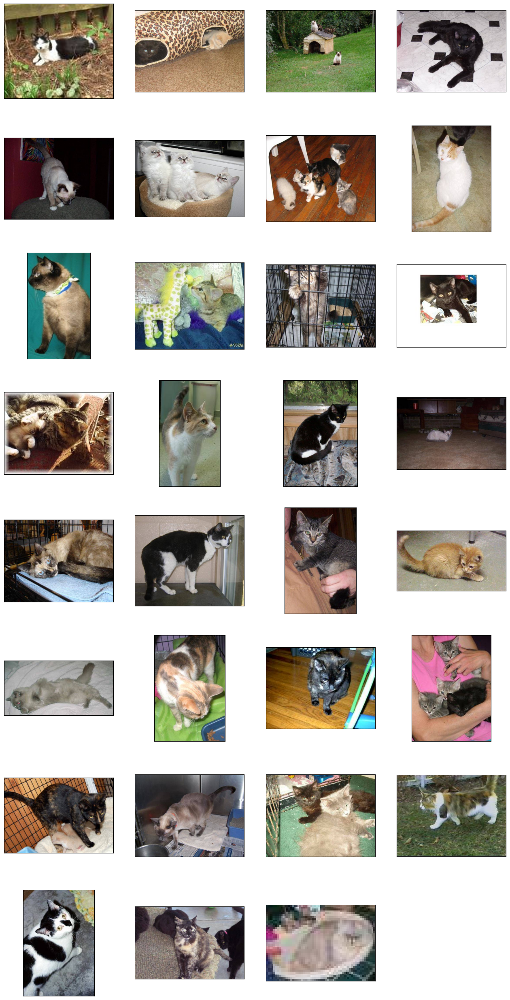

In [44]:
import math

plt.figure(figsize=(16, 4*math.ceil(len(errors_cat)/4)))
for i in range(len(errors_cat)):
    plt.subplot(math.ceil(len(errors_cat)/4),4,i+1)
    image_path = f'./cats_vs_dogs_small/test/cat/cat.{1500+errors_cat[i]}.jpg'
    image = plt.imread(image_path)
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
plt.show()